In [72]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [73]:
import pandas as pd
from google.colab import drive
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import math
from shapely.geometry import Point
from pyproj import CRS

In [74]:
drive.mount('/content/drive')
# df = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/tese/8-unidades-de-producao-para-autoconsumo-novo.parquet')
df = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/tese/8-unidades-de-producao-para-autoconsumo-novo.parquet')
shapefile = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/tese/cont-aad-caop2017/Cont_AAD_CAOP2017.shp")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [75]:
df1 = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/tese/8-unidades-de-producao-para-autoconsumo.parquet')
df1 = df1[df1['trimestre'].isin(['2022T2', '2022T3'])]
df1 = df1.rename(columns={'freguesias': 'freguesia', 'coddistritoconcelho': 'codconcelho', 'coddistritoconcelhofreguesia': 'codfreguesia', 'potencia_total_instalada_upac_kw':  'potencia_instalada_upac_kw'})
combined_df = pd.concat([df, df1], ignore_index=True)
df = combined_df

In [76]:
excel_df = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/tese/censos.xlsx')
excel_df = excel_df.rename(columns={'Unnamed: 0': 'Dicofre', 'População residente (N.º) por Local de residência à data dos Censos [2021] (NUTS - 2024), Sexo e Grupo etário (Por ciclos de vida); Decenal': 'pops'})

In [77]:
replacement_map = {
    '> 1000': '>1000',
    ']0,4]': ']0, 4]',
    ']4,20.7]': ']4, 20.7]',
    ']20.7,30]': ']20.7, 30]',
    ']30,1000]': ']30, 1000]'
}
df['escalao_de_potencia_instalada'] = df['escalao_de_potencia_instalada'].replace(replacement_map)
df = df[df['escalao_de_potencia_instalada'] != 'ND']
df['escalao_de_potencia_instalada'].value_counts()
desired_order = [']0, 4]',']4, 20.7]', ']20.7, 30]',']30, 1000]', '>1000']
df = df.merge(shapefile, left_on='codfreguesia', right_on='Dicofre', how='left') #coddistritoconcelhofreguesia
df = df.drop(['Dicofre', 'Freguesia', 'Concelho', 'Distrito', 'TAA', 'AREA_EA_Ha', 'AREA_T_Ha', 'Des_Simpli'], axis=1, errors='ignore')
df = df.merge(excel_df[['Dicofre', 'pops']], left_on='codfreguesia', right_on='Dicofre', how='left')
df = df.drop('Dicofre_y', axis=1, errors='ignore').rename(columns={'Dicofre_x': 'Dicofre'}) # Clean up merged columns

In [78]:
gdf = gpd.GeoDataFrame(df, geometry=df["geometry"])

In [79]:
shapefile_distrito = shapefile.copy()
shapefile_distrito['coddistrito'] = shapefile_distrito['Dicofre'].str[:2]
dissolved_distritos = shapefile_distrito.dissolve(by='coddistrito', aggfunc={'AREA_EA_Ha': 'sum', 'AREA_T_Ha': 'sum', 'Distrito': 'first'})
dissolved_distritos = dissolved_distritos.drop(['Freguesia', 'Concelho'], axis=1, errors='ignore')

In [80]:
dissolved_distritos

,geometry,AREA_EA_Ha,AREA_T_Ha,Distrito
coddistrito,,,,
01,"POLYGON ((-42367.01 87438.409, -42366.591 8742...",280094.18,293527.81,AVEIRO
02,"POLYGON ((8557.812 -257575.057, 8530.312 -2575...",1026332.46,1028344.69,BEJA
03,"POLYGON ((-37884.652 186463.881, -37948.151 18...",270610.55,272090.27,BRAGA
04,"POLYGON ((83518.431 166006.237, 83459.682 1659...",659853.69,659853.69,BRAGANÇA
05,"POLYGON ((36745.61 -3546.487, 36731.431 -3562....",662747.33,679773.56,CASTELO BRANCO
06,"POLYGON ((-55822.001 40696.006, -55839.14 4066...",397373.30,406724.03,COIMBRA
07,"POLYGON ((17183.447 -151703.224, 17161.787 -15...",739346.43,739346.43,ÉVORA
08,"MULTIPOLYGON (((-69685.641 -294253.284, -69681...",499679.57,2289246.78,FARO
09,"MULTIPOLYGON (((35744.382 65384.798, 35708.144...",553530.80,555157.75,GUARDA


In [81]:
# Now group data by trimestre and distrito
# df['coddistrito'] = df['coddistritoconcelhofreguesia'].str[:2] #coddistritoconcelhofreguesia

# summary = (
#     df.groupby(['trimestre', 'coddistrito'])['numero_de_instalacoes']
#     .sum()
#     .reset_index()
# )

summary = (
    df.groupby(['trimestre', 'coddistrito'])
    .agg({'numero_de_instalacoes': 'sum', 'pops': 'sum'})
    .reset_index()
)

summary['perc_instalacoes'] = (summary['numero_de_instalacoes'] / summary['pops'])
# Merge with dissolved geometries
summary_geo = summary.merge(dissolved_distritos.reset_index(), on='coddistrito')
gdf_summary = gpd.GeoDataFrame(summary_geo, geometry='geometry')

gdf_summary['upac_density'] = gdf_summary['numero_de_instalacoes'] / gdf_summary['AREA_T_Ha']

In [82]:
summary_power = (
    df.groupby(['trimestre', 'coddistrito'])
    .agg({'potencia_instalada_upac_kw': 'sum', 'pops': 'sum'})
    .reset_index()
)

summary_power['perc_power'] = (summary_power['potencia_instalada_upac_kw'] / summary_power['pops'])

# Merge with dissolved geometries
summary_power_geo = summary_power.merge(dissolved_distritos.reset_index(), on='coddistrito')
gdf_power_summary = gpd.GeoDataFrame(summary_power_geo, geometry='geometry')

# Calculate power density
gdf_power_summary['power_density'] = gdf_power_summary['potencia_instalada_upac_kw'] / gdf_power_summary['AREA_T_Ha']

In [83]:
gdf_power_summary

,trimestre,coddistrito,potencia_instalada_upac_kw,pops,perc_power,geometry,AREA_EA_Ha,AREA_T_Ha,Distrito,power_density
0,2022T2,01,82716.12,2488644,0.033237,"POLYGON ((-42367.01 87438.409, -42366.591 8742...",280094.18,293527.81,AVEIRO,0.281800
1,2022T2,02,11581.00,426066,0.027181,"POLYGON ((8557.812 -257575.057, 8530.312 -2575...",1026332.46,1028344.69,BEJA,0.011262
2,2022T2,03,76193.22,2393696,0.031831,"POLYGON ((-37884.652 186463.881, -37948.151 18...",270610.55,272090.27,BRAGA,0.280029
3,2022T2,04,5767.28,289167,0.019944,"POLYGON ((83518.431 166006.237, 83459.682 1659...",659853.69,659853.69,BRAGANÇA,0.008740
4,2022T2,05,17610.95,657308,0.026793,"POLYGON ((36745.61 -3546.487, 36731.431 -3562....",662747.33,679773.56,CASTELO BRANCO,0.025907
...,...,...,...,...,...,...,...,...,...,...
229,2025T2,14,136426.31,3411359,0.039992,"POLYGON ((-49605.287 -91992.891, -49641.025 -9...",671834.75,671834.75,SANTARÉM,0.203065
230,2025T2,15,280987.31,16468401,0.017062,"MULTIPOLYGON (((-92870.137 -139216.504, -92865...",521405.93,1268738.59,SETÚBAL,0.221470
231,2025T2,16,48558.92,976140,0.049746,"MULTIPOLYGON (((-54104.541 216070.182, -54137....",221884.22,222919.95,VIANA DO CASTELO,0.217831
232,2025T2,17,31812.39,804854,0.039526,"POLYGON ((20831.072 163804.62, 20820.682 16377...",430747.10,430747.10,VILA REAL,0.073854


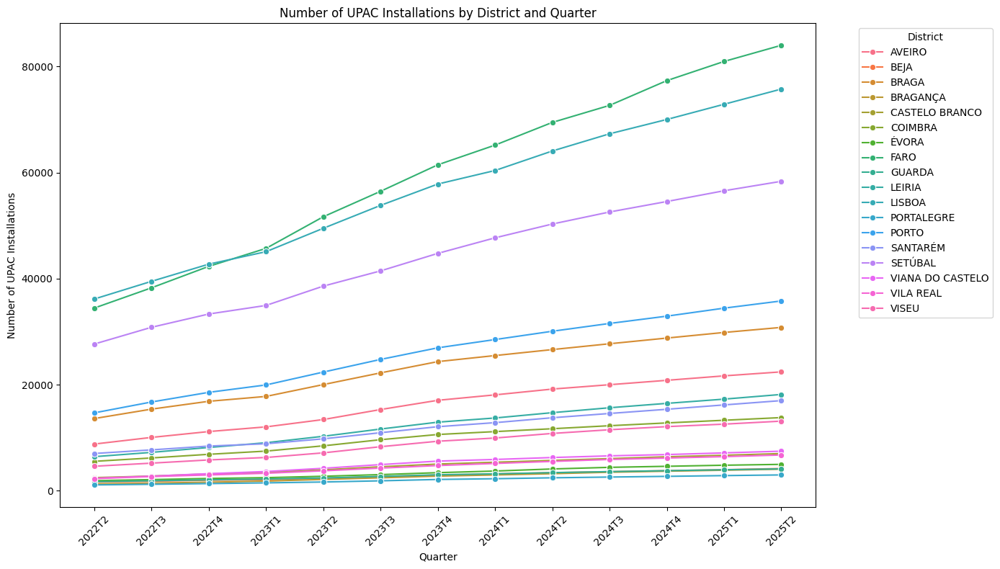

In [84]:
plt.figure(figsize=(14, 8))
sns.lineplot(data=gdf_summary, x='trimestre', y='numero_de_instalacoes', hue='Distrito', marker='o')
plt.xticks(rotation=45)
plt.title('Number of UPAC Installations by District and Quarter')
plt.xlabel('Quarter')
plt.ylabel('Number of UPAC Installations')
plt.legend(title='District', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

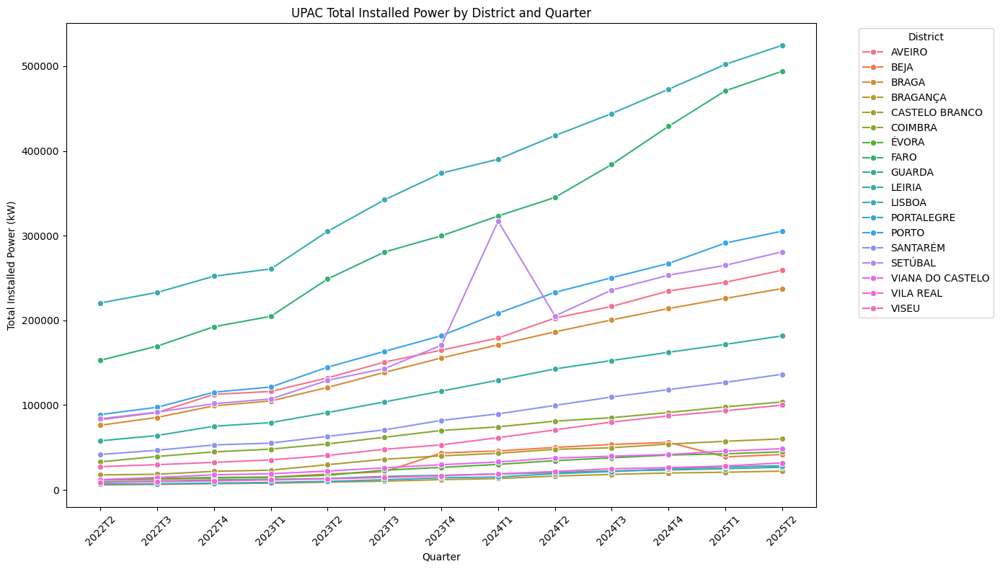

In [85]:
plt.figure(figsize=(14, 8))
sns.lineplot(data=gdf_power_summary, x='trimestre', y='potencia_instalada_upac_kw', hue='Distrito', marker='o')
plt.xticks(rotation=45)
plt.title('UPAC Total Installed Power by District and Quarter')
plt.xlabel('Quarter')
plt.ylabel('Total Installed Power (kW)')
plt.legend(title='District', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

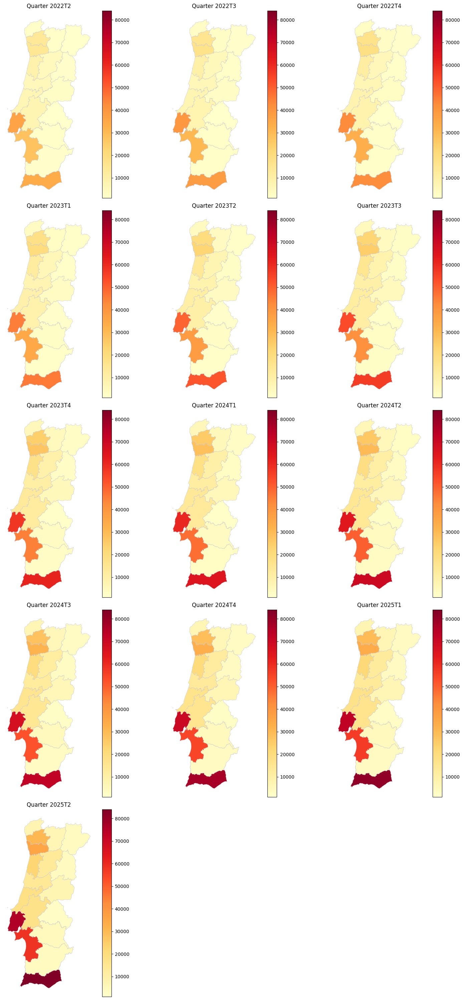

In [86]:
# Sort trimestres and get min/max values for color scaling
trimestres = sorted(gdf_summary['trimestre'].unique())
vmin = gdf_summary['numero_de_instalacoes'].min()
vmax = gdf_summary['numero_de_instalacoes'].max()

# Set number of columns per row
cols = 3
rows = math.ceil(len(trimestres) / cols)

# Create figure and axes grid
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 6 * rows))
axes = axes.flatten()

for i, trimestre in enumerate(trimestres):
    ax = axes[i]
    subset = gdf_summary[gdf_summary['trimestre'] == trimestre]

    subset.plot(column='numero_de_instalacoes',
                cmap='YlOrRd',
                linewidth=0.5,
                edgecolor='0.8',
                legend=True,
                ax=ax,
                vmin=vmin,
                vmax=vmax)
    ax.set_title(f"Quarter {trimestre}", fontsize=12)
    ax.axis('off')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()



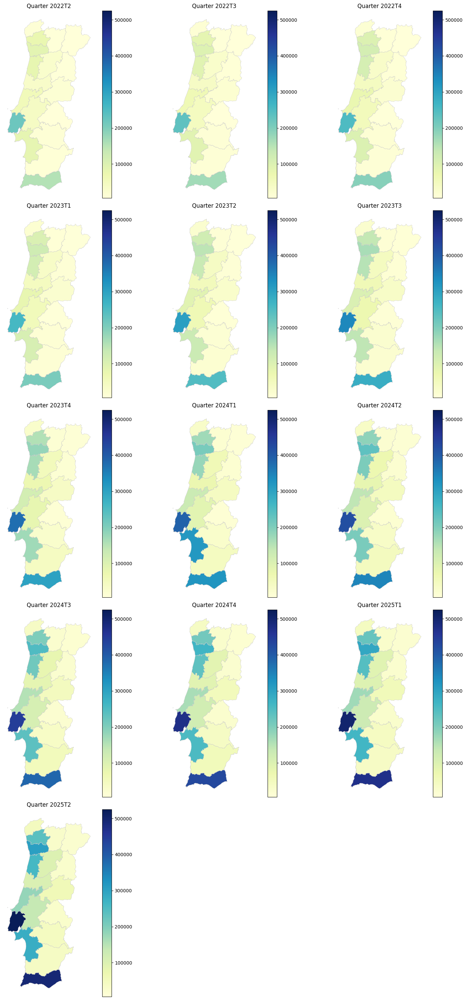

In [87]:
trimestres = sorted(gdf_power_summary['trimestre'].unique())
vmin = gdf_power_summary['potencia_instalada_upac_kw'].min()
vmax = gdf_power_summary['potencia_instalada_upac_kw'].max()

# Set number of columns per row
cols = 3
rows = math.ceil(len(trimestres) / cols)

# Create figure and axes grid
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 6 * rows))
axes = axes.flatten()

for i, trimestre in enumerate(trimestres):
    ax = axes[i]
    subset = gdf_power_summary[gdf_power_summary['trimestre'] == trimestre]

    subset.plot(column='potencia_instalada_upac_kw',
                cmap='YlGnBu',
                linewidth=0.5,
                edgecolor='0.8',
                legend=True,
                ax=ax,
                vmin=vmin,
                vmax=vmax)
    ax.set_title(f"Quarter {trimestre}", fontsize=12)
    ax.axis('off')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# Analise por Distrito

In [88]:
# Ensure coddistritoconcelho is string
# df['coddistritoconcelho'] = df['coddistritoconcelhofreguesia'].str[:4]

# Pre-dissolve geometries by 'coddistritoconcelho' just once
shapefile_concelho = shapefile.copy()
shapefile_concelho['coddistritoconcelho'] = shapefile_concelho['Dicofre'].str[:4]
dissolved_concelhos = shapefile_concelho.dissolve(by='coddistritoconcelho')

# Aggregate install counts per trimestre and concelho
df_concelho = df.copy()
df_concelho['coddistritoconcelho'] = df_concelho['codfreguesia'].str[:4]

concelho_summary = (
    df_concelho.groupby(['trimestre', 'coddistritoconcelho'])['numero_de_instalacoes']
    .sum()
    .reset_index()
)

# Merge with pre-dissolved geometries
concelho_geo = concelho_summary.merge(dissolved_concelhos.reset_index(), on='coddistritoconcelho')
gdf_concelho_trimestre = gpd.GeoDataFrame(concelho_geo, geometry='geometry')

In [89]:
concelho_summary_power = (
    df_concelho.groupby(['trimestre', 'coddistritoconcelho'])['potencia_instalada_upac_kw']
    .sum()
    .reset_index()
)

concelho_power_geo = concelho_summary_power.merge(dissolved_concelhos.reset_index(), on='coddistritoconcelho')
gdf_concelho_power = gpd.GeoDataFrame(concelho_power_geo, geometry='geometry')

In [90]:
def plot_concelhos_by_distrito_and_trimestre(gdf_concelho_trimestre, distrito_code, trimestre, cmap='YlOrRd'):
    """
    Plots concelhos of a distrito for a specific trimestre.

    Parameters:
    - gdf_concelho_trimestre: GeoDataFrame with concelho-level data + geometries
    - distrito_code: str or int (e.g., '11' for Lisboa)
    - trimestre: str (e.g., '2024T4')
    - cmap: str, optional colormap
    """
    distrito_code = str(distrito_code).zfill(2)
    gdf_concelho_trimestre['distrito'] = gdf_concelho_trimestre['coddistritoconcelho'].str[:2]

    concelhos = gdf_concelho_trimestre[
        (gdf_concelho_trimestre['distrito'] == distrito_code) &
        (gdf_concelho_trimestre['trimestre'] == trimestre)
    ]

    if concelhos.empty:
        print(f"No data found for distrito {distrito_code} in {trimestre}.")
        return

    fig, ax = plt.subplots(figsize=(10, 8))
    concelhos.plot(
        column='numero_de_instalacoes',
        cmap=cmap,
        linewidth=0.5,
        edgecolor='0.8',
        legend=True,
        ax=ax
    )
    ax.set_title(f'Concelhos do Distrito {distrito_code} – {trimestre}', fontsize=14)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

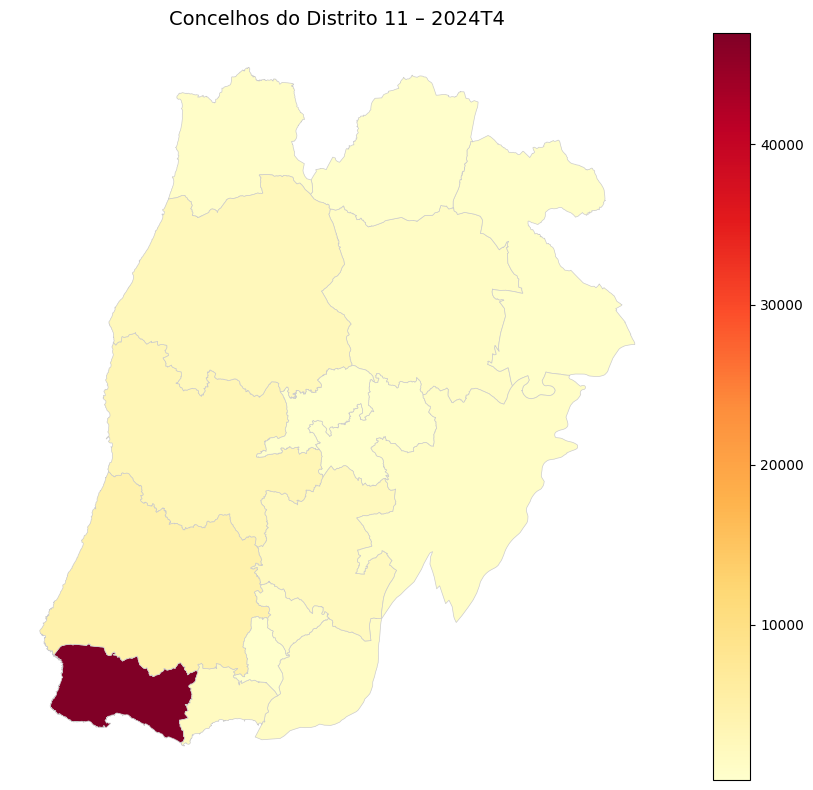

In [91]:
plot_concelhos_by_distrito_and_trimestre(gdf_concelho_trimestre, '11', '2024T4')

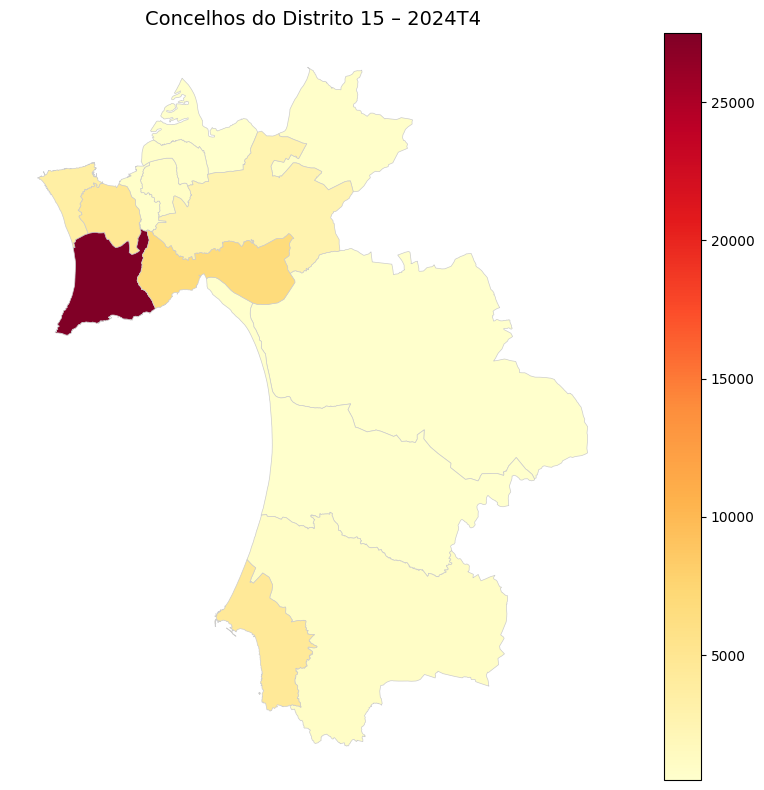

In [92]:
plot_concelhos_by_distrito_and_trimestre(gdf_concelho_trimestre, '15', '2024T4')

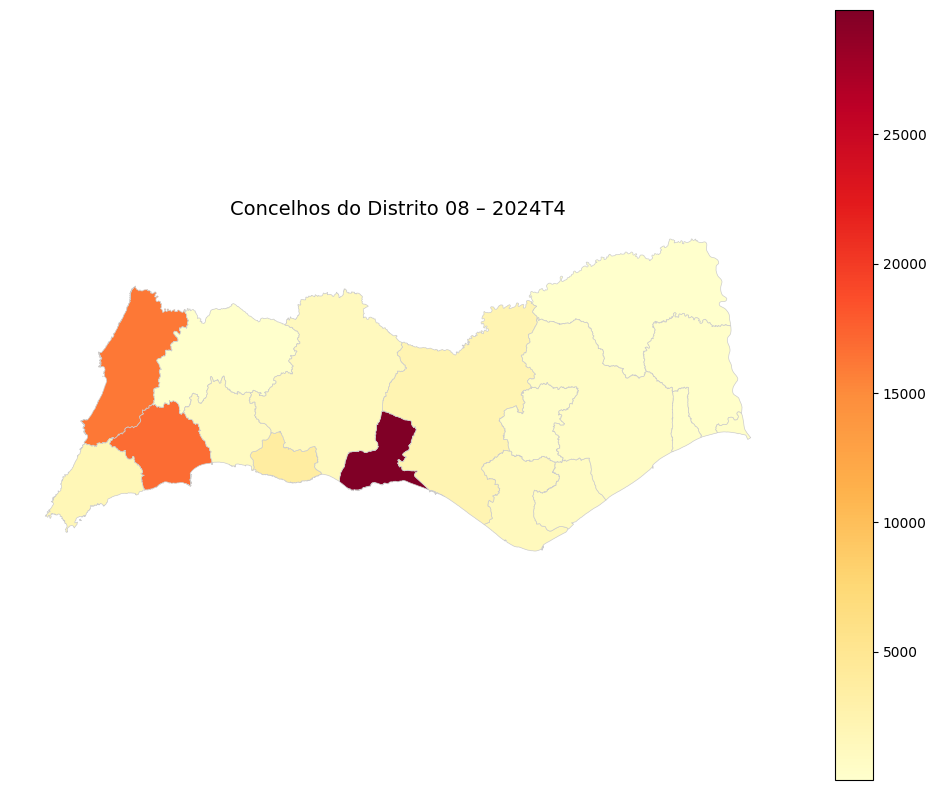

In [93]:
plot_concelhos_by_distrito_and_trimestre(gdf_concelho_trimestre, '08', '2024T4')

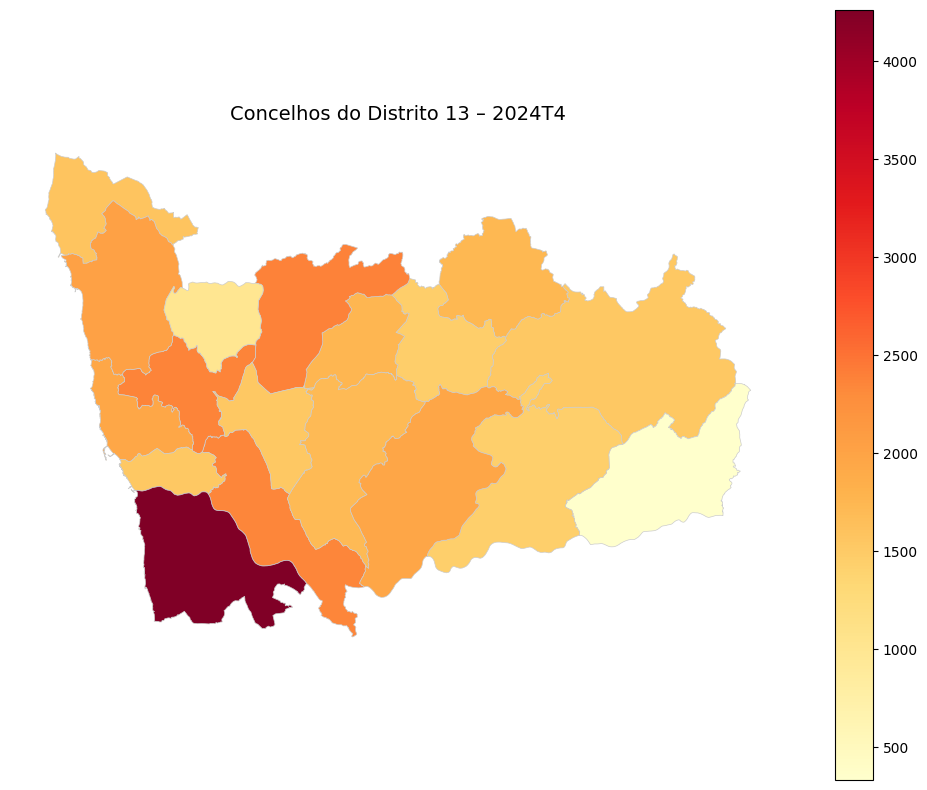

In [94]:
plot_concelhos_by_distrito_and_trimestre(gdf_concelho_trimestre, '13', '2024T4')

In [95]:
def plot_concelhos_power(gdf_concelho_power, distrito_code, trimestre, cmap='YlGnBu'):
    """
    Plots concelhos of a distrito for a specific trimestre using the 'potencia_instalada_upac_kw' column.
    """
    distrito_code = str(distrito_code).zfill(2)

    # Filter the data for the selected distrito and trimestre
    subset = gdf_concelho_power[(gdf_concelho_power['coddistritoconcelho'].str[:2] == distrito_code) &
                                (gdf_concelho_power['trimestre'] == trimestre)]

    if subset.empty:
        print(f"No data found for distrito {distrito_code} in {trimestre}.")
        return

    # Plot the map using geopandas
    fig, ax = plt.subplots(figsize=(10, 8))
    subset.plot(
        column='potencia_instalada_upac_kw',  # The column to be visualized
        cmap=cmap,  # Color map for the power
        linewidth=0.5,  # Line width for the borders
        edgecolor='0.8',  # Edge color for regions
        legend=True,  # Show a legend
        ax=ax  # Pass the axes to the plot
    )

    # Set the title of the plot
    ax.set_title(f'Potência Total Instalada no Distrito {distrito_code} – {trimestre}', fontsize=14)

    # Remove axis for better visualization of the map
    ax.axis('off')

    # Show the plot
    plt.tight_layout()
    plt.show()

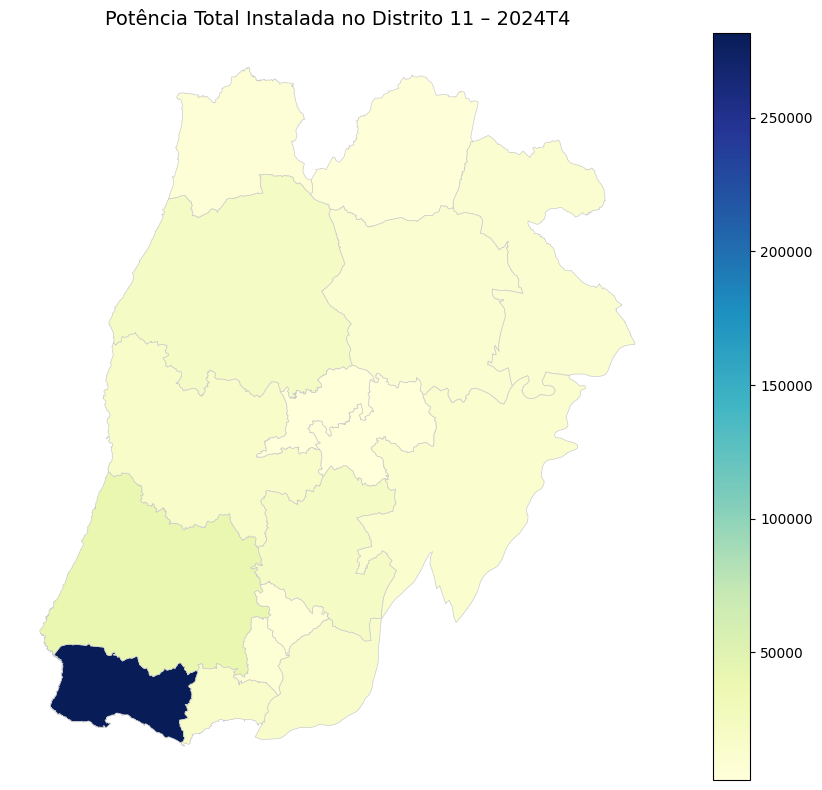

In [96]:
plot_concelhos_power(gdf_concelho_power, '11', '2024T4')

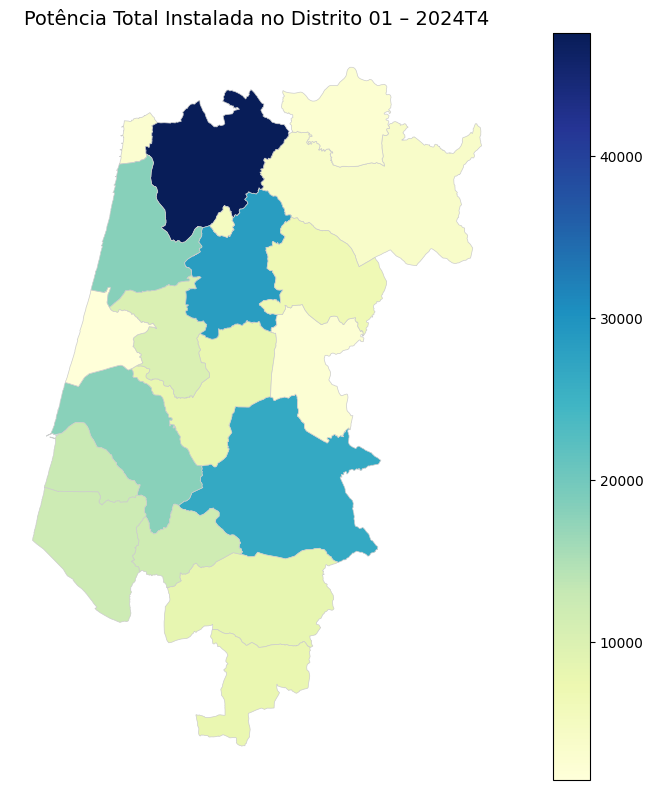

In [97]:
plot_concelhos_power(gdf_concelho_power, '01', '2024T4')

# Analyse by Concelho

In [98]:
# Assegura que o código da freguesia é string
# df['coddistritoconcelhofreguesia'] = df['coddistritoconcelhofreguesia'].astype(str)
shapefile['codfreguesia'] = shapefile['Dicofre'].astype(str)

# Dissolve geometrias por freguesia
dissolved_freguesias = shapefile.dissolve(by='codfreguesia')

freguesia_summary = (
    df.groupby(['trimestre', 'codfreguesia'])['numero_de_instalacoes']
    .sum()
    .reset_index()
)

freguesia_geo = freguesia_summary.merge(
    dissolved_freguesias.reset_index(),
    on='codfreguesia',
    how='left'
)

gdf_freguesia_trimestre = gpd.GeoDataFrame(freguesia_geo, geometry='geometry')


In [99]:
freguesia_summary_power = (
    df.groupby(['trimestre', 'codfreguesia'])['potencia_instalada_upac_kw']
    .sum()
    .reset_index()
)

freguesia_power_geo = freguesia_summary_power.merge(
    dissolved_freguesias.reset_index(),
    on='codfreguesia',
    how='left'
)

gdf_freguesia_power = gpd.GeoDataFrame(freguesia_power_geo, geometry='geometry')


In [100]:
def plot_freguesias_by_concelho_and_trimestre(gdf_freguesia_trimestre, coddistritoconcelho_code, trimestre_to_plot, cmap='YlOrRd'):
    """
    Plota instalações por freguesia dentro de um concelho específico e trimestre.

    Parâmetros:
    - gdf_freguesia_trimestre: GeoDataFrame com dados de freguesia + geometria
    - coddistritoconcelho_code: código do concelho (4 dígitos)
    - trimestre_to_plot: trimestre a mostrar (e.g., '2024T4')
    - cmap: colormap (padrão = 'YlOrRd')
    """
    coddistritoconcelho_code = str(coddistritoconcelho_code).zfill(4)

    subset = gdf_freguesia_trimestre[
        (gdf_freguesia_trimestre['codfreguesia'].str.startswith(coddistritoconcelho_code)) &
        (gdf_freguesia_trimestre['trimestre'] == trimestre_to_plot)
    ]

    if subset.empty:
        print(f"Nenhum dado encontrado para o concelho {coddistritoconcelho_code} em {trimestre_to_plot}.")
        return

    fig, ax = plt.subplots(figsize=(10, 8))
    subset.plot(column='numero_de_instalacoes',
                cmap=cmap,
                linewidth=0.5,
                edgecolor='0.8',
                legend=True,
                ax=ax)

    ax.set_title(f'Instalações no Concelho {coddistritoconcelho_code} – {trimestre_to_plot}', fontsize=14)
    ax.axis('off')
    plt.tight_layout()
    plt.show()


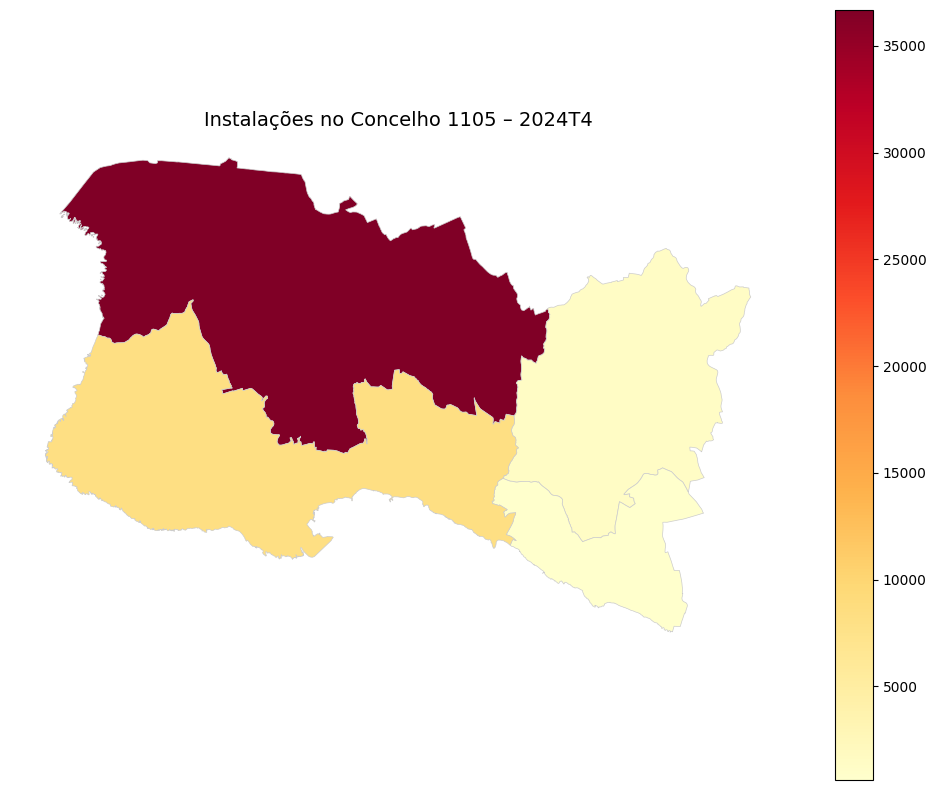

In [101]:
plot_freguesias_by_concelho_and_trimestre(gdf_freguesia_trimestre, coddistritoconcelho_code='1105', trimestre_to_plot='2024T4')

In [102]:
def plot_freguesias_power(gdf_freguesia_power, coddistritoconcelho_code, trimestre_to_plot, cmap='YlGnBu'):
    coddistritoconcelho_code = str(coddistritoconcelho_code).zfill(4)

    subset = gdf_freguesia_power[
        (gdf_freguesia_power['codfreguesia'].str.startswith(coddistritoconcelho_code)) &
        (gdf_freguesia_power['trimestre'] == trimestre_to_plot)
    ]

    if subset.empty:
        print(f"Nenhum dado encontrado para o concelho {coddistritoconcelho_code} em {trimestre_to_plot}.")
        return

    fig, ax = plt.subplots(figsize=(10, 8))
    subset.plot(column='potencia_instalada_upac_kw',
                cmap=cmap,
                linewidth=0.5,
                edgecolor='0.8',
                legend=True,
                ax=ax)

    ax.set_title(f'Potência Total no Concelho {coddistritoconcelho_code} – {trimestre_to_plot}', fontsize=14)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

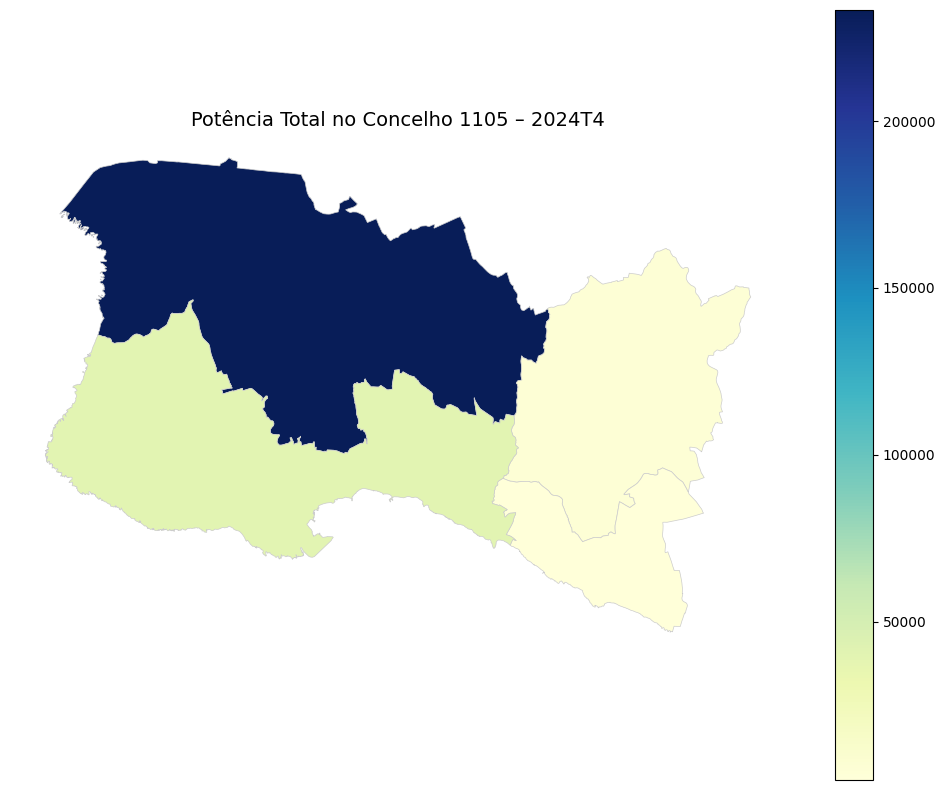

In [103]:
plot_freguesias_power(gdf_freguesia_power, coddistritoconcelho_code='1105', trimestre_to_plot='2024T4')

# Acabar

In [104]:
def plot_freguesias_by_district_and_trimestre(gdf_freguesia_trimestre, distrito_code, trimestre, cmap='YlOrRd'):
    """
    Plots freguesias within a specific district for a given trimestre.

    Parameters:
    - gdf_freguesia_trimestre: GeoDataFrame with freguesia-level data + geometries
    - distrito_code: str or int (e.g., '11' for Lisboa)
    - trimestre: str (e.g., '2024T4')
    - cmap: str, optional colormap
    """
    distrito_code = str(distrito_code).zfill(2)
    gdf_freguesia_trimestre['distrito'] = gdf_freguesia_trimestre['codfreguesia'].str[:2]

    # Filter data by distrito and trimestre
    freguesias_in_district = gdf_freguesia_trimestre[
        (gdf_freguesia_trimestre['distrito'] == distrito_code) &
        (gdf_freguesia_trimestre['trimestre'] == trimestre)
    ]

    if freguesias_in_district.empty:
        print(f"No data found for distrito {distrito_code} in {trimestre}.")
        return

    # Plot the map
    fig, ax = plt.subplots(figsize=(12, 10))
    freguesias_in_district.plot(
        column='numero_de_instalacoes',
        cmap=cmap,
        linewidth=0.5,
        edgecolor='0.8',
        legend=True,
        ax=ax
    )
    ax.set_title(f'Instalações por Freguesia no Distrito {distrito_code} – {trimestre}', fontsize=14)
    ax.axis('off')
    plt.tight_layout()
    plt.show()


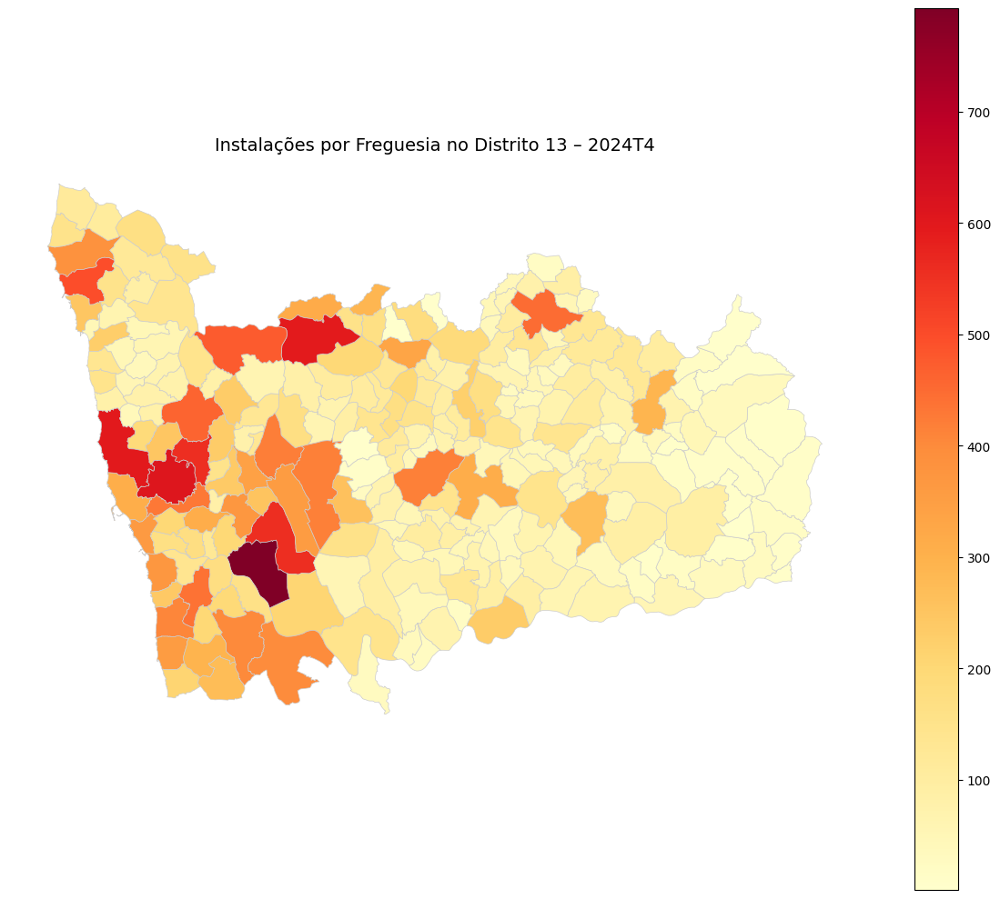

In [105]:
plot_freguesias_by_district_and_trimestre(gdf_freguesia_trimestre, '13', '2024T4')

In [106]:
def plot_freguesias_by_district_and_trimestre_power(gdf_freguesia_trimestre, distrito_code, trimestre, cmap='YlGnBu'):
    """
    Plots freguesias within a specific district for a given trimestre based on total installed power.

    Parameters:
    - gdf_freguesia_trimestre: GeoDataFrame with freguesia-level data + geometries
    - distrito_code: str or int (e.g., '11' for Lisboa)
    - trimestre: str (e.g., '2024T4')
    - cmap: str, optional colormap
    """
    distrito_code = str(distrito_code).zfill(2)
    gdf_freguesia_trimestre['distrito'] = gdf_freguesia_trimestre['codfreguesia'].str[:2]

    # Filter data by distrito and trimestre
    freguesias_in_district = gdf_freguesia_trimestre[
        (gdf_freguesia_trimestre['distrito'] == distrito_code) &
        (gdf_freguesia_trimestre['trimestre'] == trimestre)
    ]

    if freguesias_in_district.empty:
        print(f"No data found for distrito {distrito_code} in {trimestre}.")
        return

    # Plot the map
    fig, ax = plt.subplots(figsize=(12, 10))
    freguesias_in_district.plot(
        column='potencia_instalada_upac_kw',
        cmap=cmap,
        linewidth=0.5,
        edgecolor='0.8',
        legend=True,
        ax=ax
    )
    ax.set_title(f'Potência Total Instalada por Freguesia no Distrito {distrito_code} – {trimestre}', fontsize=14)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

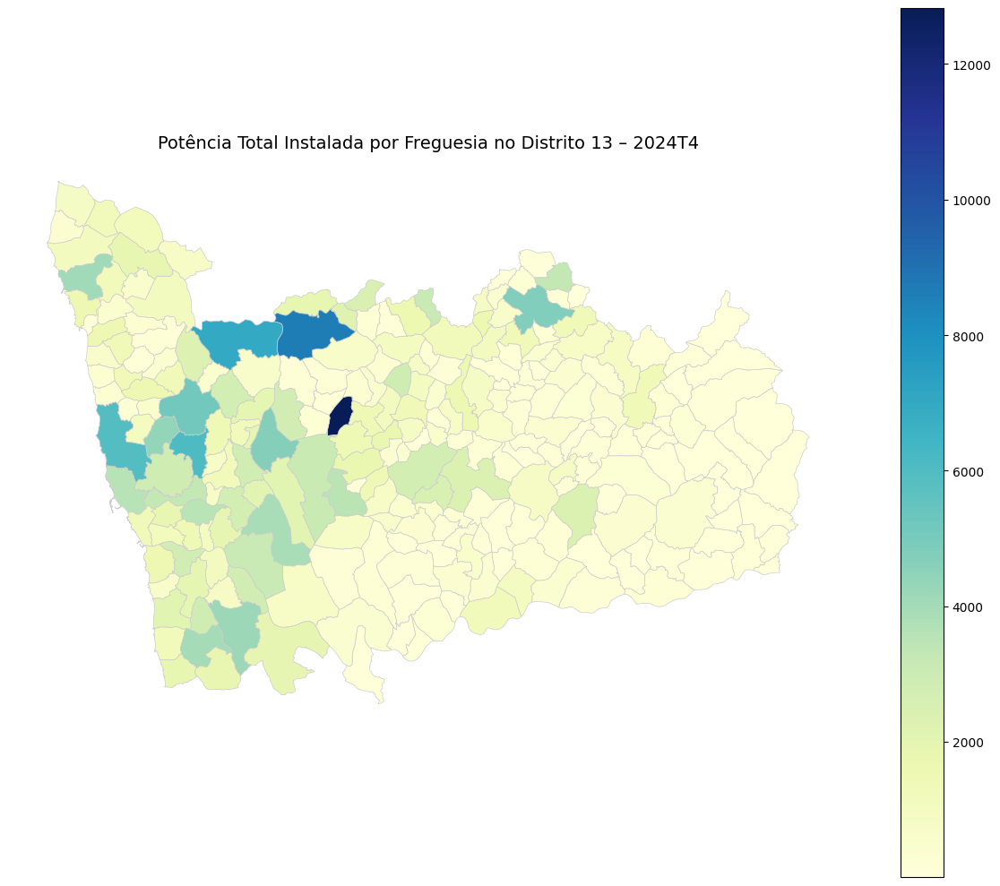

In [107]:
plot_freguesias_by_district_and_trimestre_power(gdf_freguesia_power, distrito_code='13', trimestre='2024T4')

# Analise with NUTS3


In [108]:
conversion_df = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/tese/EU-27-LAU-2024-NUTS-2024.xlsx', sheet_name="PT")
columns_to_keep = ['NUTS 3 CODE', 'LAU CODE']
conversion_df = conversion_df[columns_to_keep]
conversion_df = conversion_df.rename(columns={'LAU CODE': 'codfreguesia'})
# conversion_df

In [109]:
shapefile_nuts = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/tese/NUTS_RG_01M_2024_3035.shp/NUTS_RG_01M_2024_3035.shp")
shapefile_nuts = shapefile_nuts[
    (shapefile_nuts['CNTR_CODE'] == 'PT') &
    (shapefile_nuts['LEVL_CODE'] == 3) &
    (~shapefile_nuts['NUTS_ID'].isin(['PT200', 'PT300']))
].reset_index(drop=True)
final_nuts = shapefile_nuts.to_crs(CRS("EPSG:4326"))

In [110]:
new_df = df.copy()
new_df = new_df.drop('geometry', axis=1, errors='ignore')
merged_df = pd.merge(
    new_df, conversion_df, on='codfreguesia', how='left'
)
merged_df = merged_df[[
    'trimestre', 'escalao_de_potencia_instalada',
    'numero_de_instalacoes', 'potencia_instalada_upac_kw',
    'NUTS 3 CODE'
]].rename(columns={'NUTS 3 CODE': 'NUTS_ID'})

In [111]:
# merged_df = merged_df.merge(final_nuts[['NUTS_ID', 'geometry']], on='NUTS_ID', how='left')

In [112]:
grouped_df = (
    merged_df.groupby(['trimestre', 'NUTS_ID'])
    .agg({'numero_de_instalacoes': 'sum'})
    .reset_index()
)
# grouped_df

In [113]:
grouped_df = grouped_df.merge(final_nuts[['NUTS_ID', 'geometry']], on='NUTS_ID', how='left')

In [114]:
new_gdf = gpd.GeoDataFrame(grouped_df, geometry=grouped_df["geometry"])

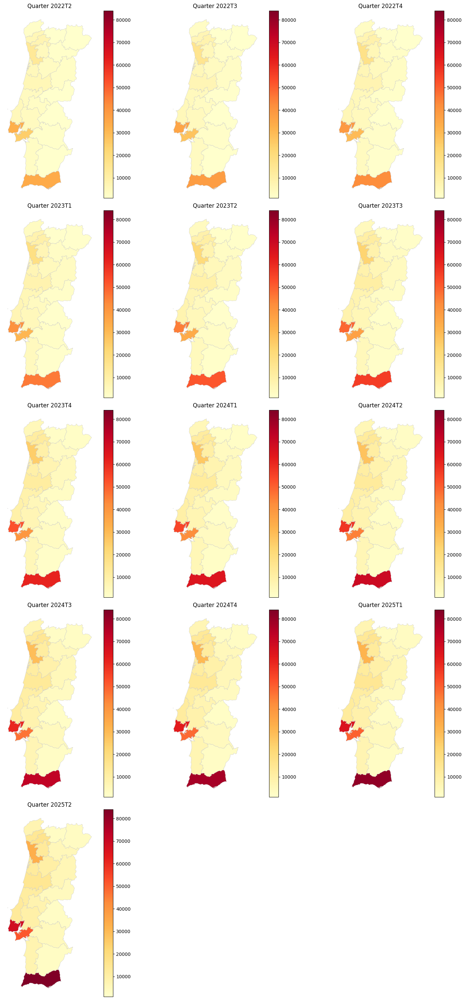

In [115]:
trimestres = sorted(new_gdf['trimestre'].unique())
vmin = new_gdf['numero_de_instalacoes'].min()
vmax = new_gdf['numero_de_instalacoes'].max()

cols = 3
rows = math.ceil(len(trimestres) / cols)

# Create figure and axes grid
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 6 * rows))
axes = axes.flatten()

for i, trimestre in enumerate(trimestres):
    ax = axes[i]
    subset = new_gdf[new_gdf['trimestre'] == trimestre]

    subset.plot(column='numero_de_instalacoes',
                cmap='YlOrRd',
                linewidth=0.5,
                edgecolor='0.8',
                legend=True,
                ax=ax,
                vmin=vmin,
                vmax=vmax)
    ax.set_title(f"Quarter {trimestre}", fontsize=12)
    ax.axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [116]:
df_district_power = (
    df.groupby(['distrito', 'trimestre'])['potencia_instalada_upac_kw']
    .sum()
    .reset_index()
    .sort_values(['distrito', 'trimestre'])
)

df_district_power['diff_kw'] = df_district_power.groupby('distrito')['potencia_instalada_upac_kw'].diff()
df_district_power['pct_change'] = df_district_power.groupby('distrito')['potencia_instalada_upac_kw'].pct_change() * 100

# Step 2: Compute national average % change
national_pct_change = (
    df.groupby('trimestre')['potencia_instalada_upac_kw']
    .sum()
    .pct_change() * 100
)

df_national_avg = national_pct_change.reset_index().rename(columns={'potencia_instalada_upac_kw': 'pct_change'})
df_national_avg['distrito'] = 'Média Nacional'

df_combined = pd.concat([
    df_district_power[['distrito', 'trimestre', 'pct_change']],
    df_national_avg[['distrito', 'trimestre', 'pct_change']]
])


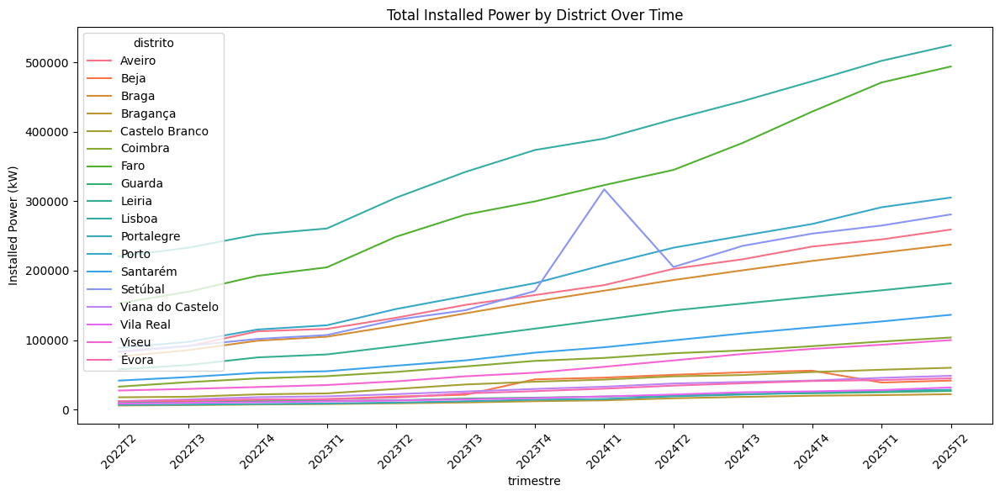

In [117]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_district_power, x='trimestre', y='potencia_instalada_upac_kw', hue='distrito')
plt.title('Total Installed Power by District Over Time')
plt.xticks(rotation=45)
plt.ylabel('Installed Power (kW)')
plt.tight_layout()
plt.show()


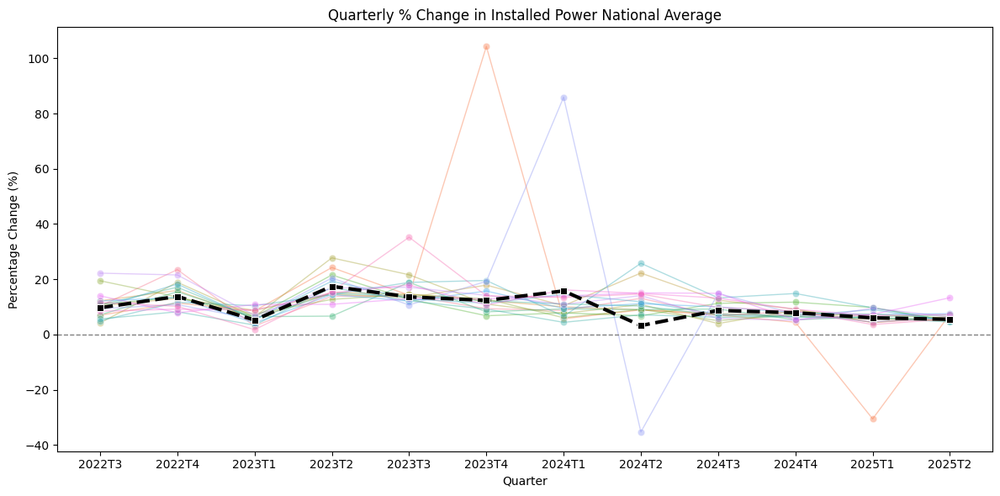

In [144]:
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=df_combined[df_combined['distrito'] != 'Média Nacional'],
    x='trimestre',
    y='pct_change',
    hue='distrito',
    alpha=0.4,
    linewidth=1,
    marker='o'
)

sns.lineplot(
    data=df_combined[df_combined['distrito'] == 'Média Nacional'],
    x='trimestre',
    y='pct_change',
    color='black',
    linewidth=3,
    linestyle='--',
    marker='s',
    label='Média Nacional'
)

plt.axhline(0, color='gray', linestyle='--', linewidth=1)
plt.title('Quarterly % Change in Installed Power National Average')
plt.xlabel('Quarter')
plt.ylabel('Percentage Change (%)')
# plt.legend(title='District', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend([],[], frameon=False)
plt.tight_layout()
plt.show()


In [119]:
top_spikes = df_district_power.sort_values(by='diff_kw', ascending=False).head(10)
print(top_spikes[['distrito', 'trimestre', 'diff_kw', 'pct_change']])

    distrito trimestre    diff_kw  pct_change
176  Setúbal    2024T1  146554.60   85.908092
88      Faro    2024T4   44976.67   11.709833
121   Lisboa    2023T2   44394.53   17.025599
82      Faro    2023T2   44120.14   21.544876
89      Faro    2025T1   41970.10    9.781647
87      Faro    2024T3   38968.38   11.291098
122   Lisboa    2023T3   37127.55   12.167136
83      Faro    2023T3   31791.79   12.772780
123   Lisboa    2023T4   31484.16    9.198532
178  Setúbal    2024T3   30491.00   14.852812


In [120]:
gdf_summary_sorted = gdf_summary.sort_values(['Distrito', 'trimestre']).copy()

# Absolute change
gdf_summary_sorted['diff_instalacoes'] = gdf_summary_sorted.groupby('Distrito')['numero_de_instalacoes'].diff()

# Percent change
gdf_summary_sorted['pct_change_instalacoes'] = (
    gdf_summary_sorted.groupby('Distrito')['numero_de_instalacoes'].pct_change() * 100
)

avg_change = gdf_summary_sorted.groupby('trimestre')['pct_change_instalacoes'].mean().reset_index()
avg_change['Distrito'] = 'Média Nacional'

plot_data = pd.concat([gdf_summary_sorted, avg_change], ignore_index=True)

In [121]:
# plt.figure(figsize=(14, 8))

# # Main plot
# sns.lineplot(
#     data=plot_data,
#     x='trimestre',
#     y='pct_change_instalacoes',
#     hue='Distrito',
#     style='Distrito',
#     markers=True,
#     dashes=False
# )

# plt.axhline(0, color='gray', linestyle='--', linewidth=1)
# plt.xticks(rotation=45)
# plt.title('% de Variação no Número de Instalações por Distrito e Trimestre (com Média Nacional)')
# plt.xlabel('Trimestre')
# plt.ylabel('Variação (%)')
# plt.legend(title='Distrito', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()

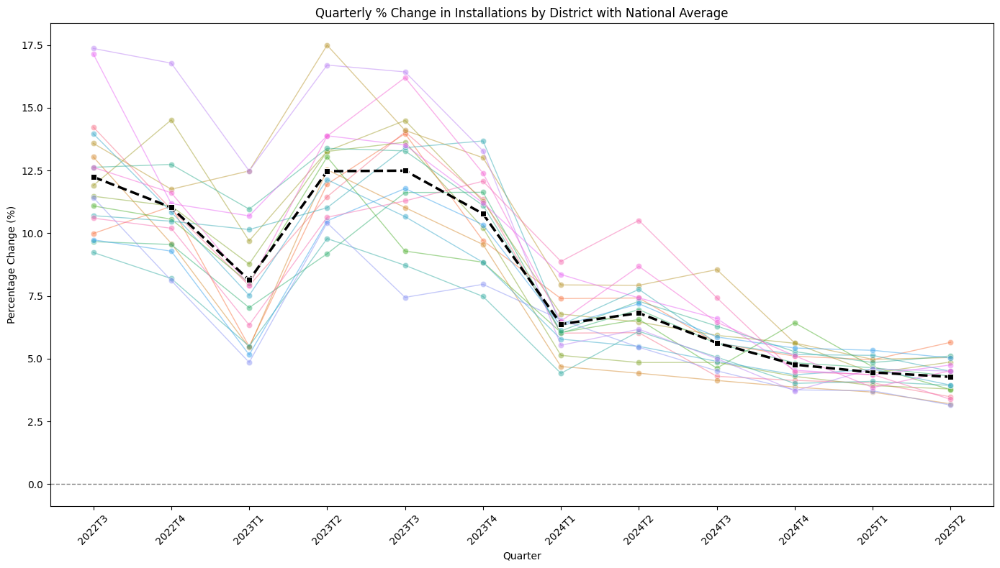

In [145]:
plt.figure(figsize=(14, 8))

# Separate district and national data
distrito_data = plot_data[plot_data['Distrito'] != 'Média Nacional']
media_nacional_data = plot_data[plot_data['Distrito'] == 'Média Nacional']

# Plot districts with standard style
sns.lineplot(
    data=distrito_data,
    x='trimestre',
    y='pct_change_instalacoes',
    hue='Distrito',
    alpha=0.5,
    linewidth=1,
    marker='o'
)

# Plot national average with distinct style
sns.lineplot(
    data=media_nacional_data,
    x='trimestre',
    y='pct_change_instalacoes',
    color='black',
    linewidth=2.5,
    linestyle='--',
    marker='s'
)

plt.axhline(0, color='gray', linestyle='--', linewidth=1)
plt.xticks(rotation=45)
plt.title('Quarterly % Change in Installations by District with National Average')
plt.xlabel('Quarter')
plt.ylabel('Percentage Change (%)')

# Remove legend completely
plt.legend([],[], frameon=False)

plt.tight_layout()
plt.show()


In [123]:
top_spikes = gdf_summary_sorted.sort_values(by='diff_instalacoes', ascending=False).head(10)
print(top_spikes[['Distrito', 'trimestre', 'numero_de_instalacoes', 'diff_instalacoes', 'pct_change_instalacoes']])


    Distrito trimestre  numero_de_instalacoes  diff_instalacoes  \
79      FARO    2023T2                  51678            5962.0   
115     FARO    2023T4                  61473            4995.0   
97      FARO    2023T3                  56478            4800.0   
187     FARO    2024T4                  77351            4672.0   
82    LISBOA    2023T2                  49504            4413.0   
100   LISBOA    2023T3                  53821            4317.0   
151     FARO    2024T2                  69469            4280.0   
43      FARO    2022T4                  42325            4043.0   
118   LISBOA    2023T4                  57847            4026.0   
25      FARO    2022T3                  38282            3821.0   

     pct_change_instalacoes  
79                13.041386  
115                8.844152  
97                 9.288285  
187                6.428267  
82                 9.786875  
100                8.720507  
151                6.565525  
43                10.5

# Pops

In [124]:
excel_df = excel_df[excel_df['Dicofre'].astype(str).str.len() == 2]
display(excel_df)

,Dicofre,pops
0,PT,10343066
2,11,3586586
1523,19,1653195
2410,1D,809905
2685,1A,2062306
2777,1B,807902
2825,1C,468672
3108,15,467343
3194,20,236413
3372,30,250744


In [125]:
display(excel_df[excel_df['Dicofre'] == '01'])

,Dicofre,pops


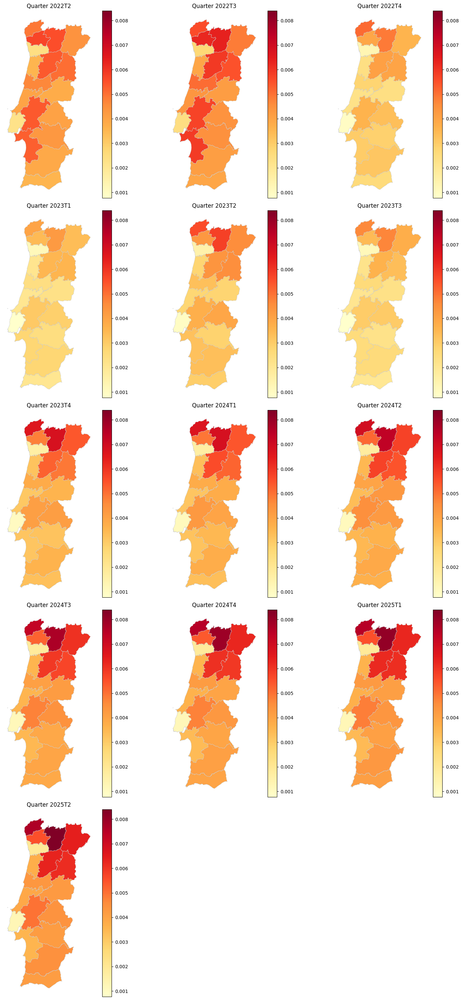

In [126]:
trimestres = sorted(gdf_summary['trimestre'].unique())
vmin = gdf_summary['perc_instalacoes'].min()
vmax = gdf_summary['perc_instalacoes'].max()

# Set number of columns per row
cols = 3
rows = math.ceil(len(trimestres) / cols)

# Create figure and axes grid
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 6 * rows))
axes = axes.flatten()

for i, trimestre in enumerate(trimestres):
    ax = axes[i]
    subset = gdf_summary[gdf_summary['trimestre'] == trimestre]

    subset.plot(column='perc_instalacoes',
                cmap='YlOrRd',
                linewidth=0.5,
                edgecolor='0.8',
                legend=True,
                ax=ax,
                vmin=vmin,
                vmax=vmax)
    ax.set_title(f"Quarter {trimestre}", fontsize=12)
    ax.axis('off')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

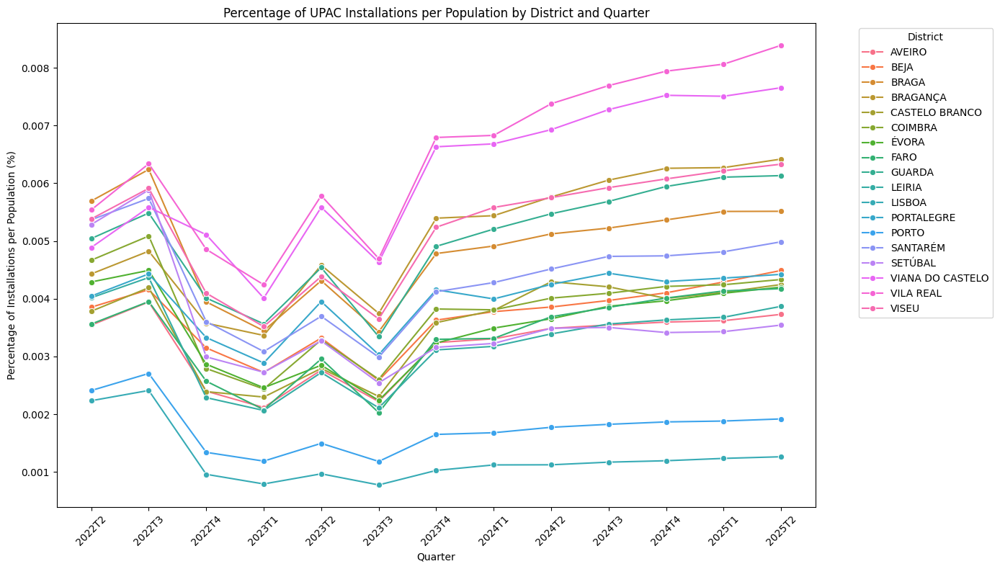

In [127]:
plt.figure(figsize=(14, 8))
sns.lineplot(data=gdf_summary, x='trimestre', y='perc_instalacoes', hue='Distrito', marker='o')
plt.xticks(rotation=45)
plt.title('Percentage of UPAC Installations per Population by District and Quarter')
plt.xlabel('Quarter')
plt.ylabel('Percentage of Installations per Population (%)')
plt.legend(title='District', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

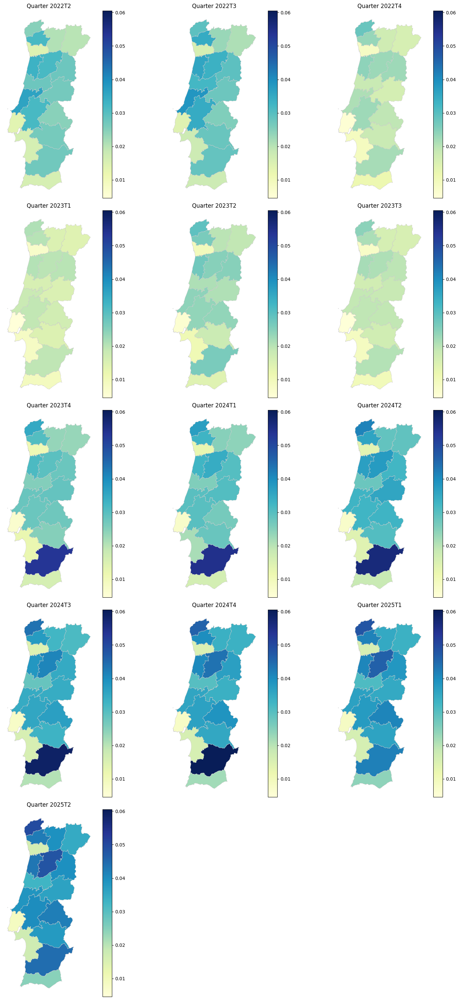

In [128]:
trimestres = sorted(gdf_power_summary['trimestre'].unique())
vmin = gdf_power_summary['perc_power'].min()
vmax = gdf_power_summary['perc_power'].max()

# Set number of columns per row
cols = 3
rows = math.ceil(len(trimestres) / cols)

# Create figure and axes grid
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 6 * rows))
axes = axes.flatten()

for i, trimestre in enumerate(trimestres):
    ax = axes[i]
    subset = gdf_power_summary[gdf_power_summary['trimestre'] == trimestre]

    subset.plot(column='perc_power',
                cmap='YlGnBu',
                linewidth=0.5,
                edgecolor='0.8',
                legend=True,
                ax=ax,
                vmin=vmin,
                vmax=vmax)
    ax.set_title(f"Quarter {trimestre}", fontsize=12)
    ax.axis('off')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

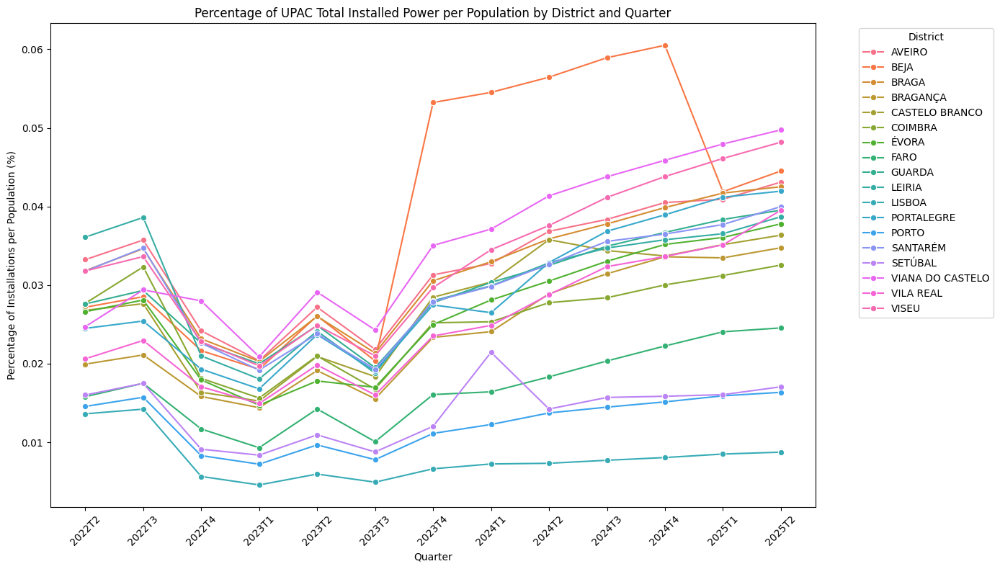

In [129]:
plt.figure(figsize=(14, 8))
sns.lineplot(data=gdf_power_summary, x='trimestre', y='perc_power', hue='Distrito', marker='o')
plt.xticks(rotation=45)
plt.title('Percentage of UPAC Total Installed Power per Population by District and Quarter')
plt.xlabel('Quarter')
plt.ylabel('Percentage of Installations per Population (%)')
plt.legend(title='District', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

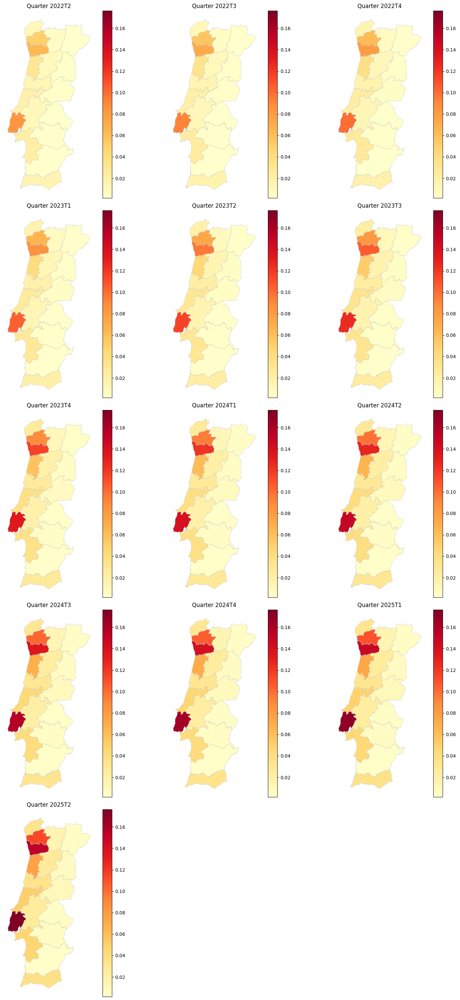

In [130]:
trimestres = sorted(gdf_summary['trimestre'].unique())
vmin = gdf_summary['upac_density'].min()
vmax = gdf_summary['upac_density'].max()

# Set number of columns per row
cols = 3
rows = math.ceil(len(trimestres) / cols)

# Create figure and axes grid
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 6 * rows))
axes = axes.flatten()

for i, trimestre in enumerate(trimestres):
    ax = axes[i]
    subset = gdf_summary[gdf_summary['trimestre'] == trimestre]

    subset.plot(column='upac_density',
                cmap='YlOrRd',
                linewidth=0.5,
                edgecolor='0.8',
                legend=True,
                ax=ax,
                vmin=vmin,
                vmax=vmax)
    ax.set_title(f"Quarter {trimestre}", fontsize=12)
    ax.axis('off')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

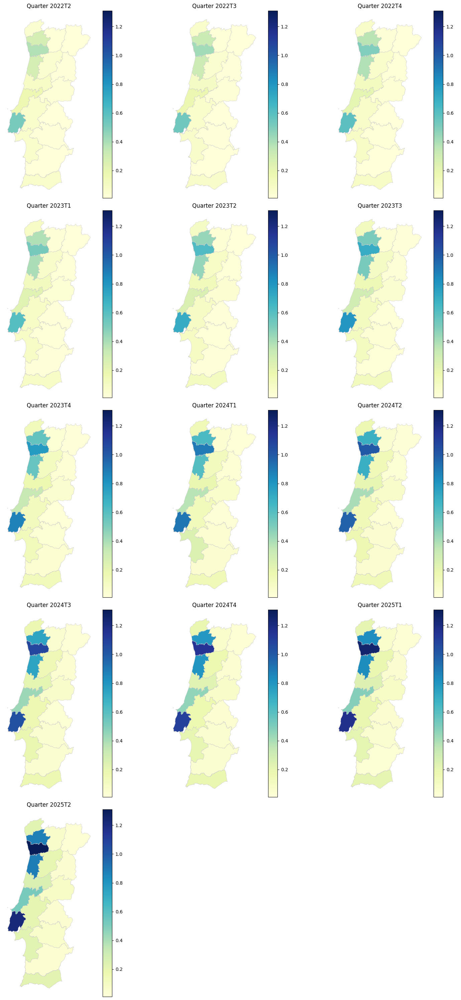

In [131]:
trimestres = sorted(gdf_power_summary['trimestre'].unique())
vmin = gdf_power_summary['power_density'].min()
vmax = gdf_power_summary['power_density'].max()

# Set number of columns per row
cols = 3
rows = math.ceil(len(trimestres) / cols)

# Create figure and axes grid
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 6 * rows))
axes = axes.flatten()

for i, trimestre in enumerate(trimestres):
    ax = axes[i]
    subset = gdf_power_summary[gdf_power_summary['trimestre'] == trimestre]

    subset.plot(column='power_density',
                cmap='YlGnBu',
                linewidth=0.5,
                edgecolor='0.8',
                legend=True,
                ax=ax,
                vmin=vmin,
                vmax=vmax)
    ax.set_title(f"Quarter {trimestre}", fontsize=12)
    ax.axis('off')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# tipo_de_tecnologia

In [132]:
df['tipo_de_tecnologia'].unique()
df['tipo_de_tecnologia'].value_counts()

,count
tipo_de_tecnologia,
Solar,139164
Não Atribuído,8745
Biogás,405
Eólica,194
Hídrica,13
Cogeração não renovável,11
Biomassa,7
Fotovoltaica,6


In [133]:
df['tipo_de_tecnologia'].isna().sum()

np.int64(13811)

In [134]:
pd.crosstab(df['tipo_de_tecnologia'], df['escalao_de_potencia_instalada'])[desired_order]

escalao_de_potencia_instalada,"]0, 4]","]4, 20.7]","]20.7, 30]","]30, 1000]",>1000
tipo_de_tecnologia,,,,,
Biogás,0,11,0,20,374
Biomassa,7,0,0,0,0
Cogeração não renovável,0,0,0,11,0
Eólica,52,120,0,15,7
Fotovoltaica,0,0,0,0,6
Hídrica,13,0,0,0,0
Não Atribuído,5289,1841,465,1124,26
Solar,44814,43696,22883,27656,115


In [135]:
df['tipo_de_tecnologia'] = df['tipo_de_tecnologia'].replace({
    'Fotovoltaica': 'Solar'
})

In [136]:
df['tipo_de_tecnologia'] = df['tipo_de_tecnologia'].fillna('Não Atribuído')

<Axes: xlabel='trimestre'>

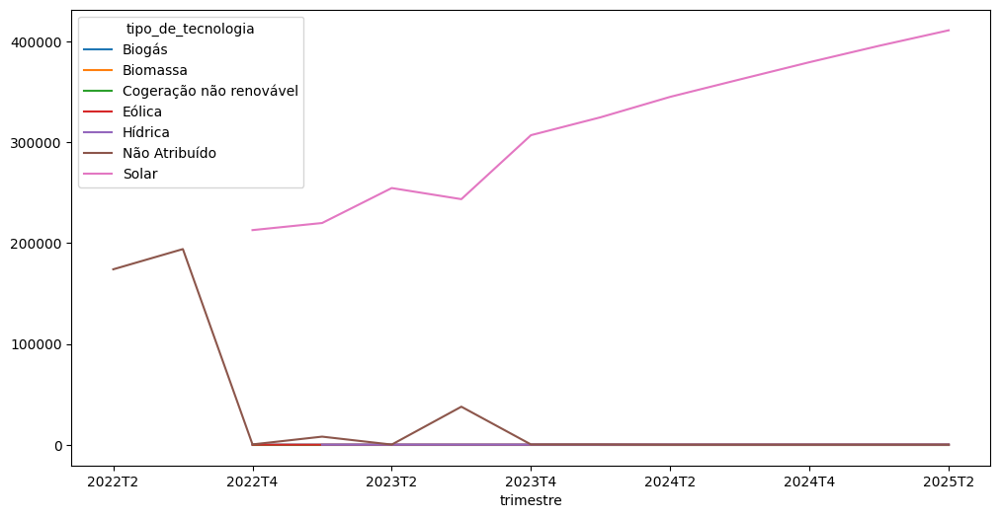

In [137]:
df.groupby(['trimestre', 'tipo_de_tecnologia'])['numero_de_instalacoes'].sum().unstack().plot(kind='line', figsize=(12,6))

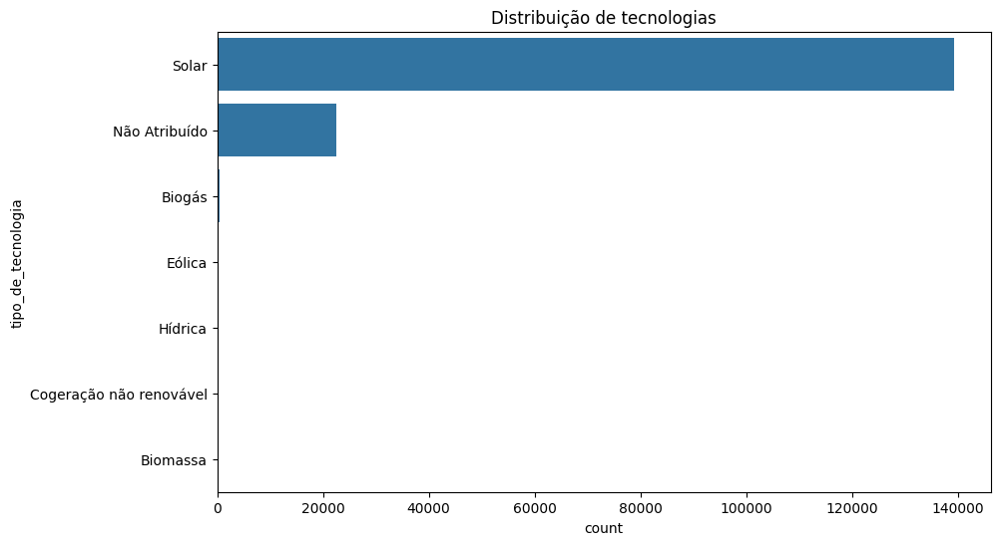

In [138]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, y='tipo_de_tecnologia', order=df['tipo_de_tecnologia'].value_counts().index)
plt.title("Distribuição de tecnologias")
plt.show()

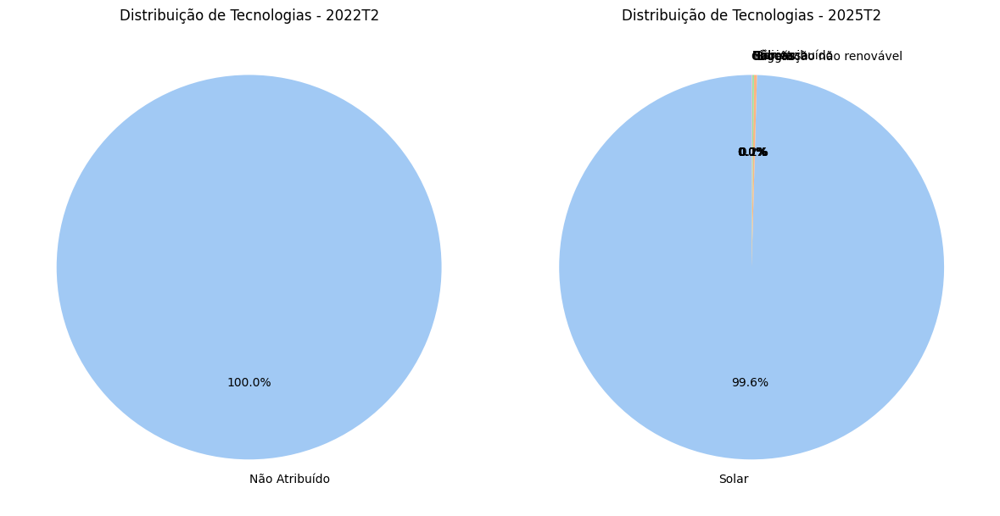

In [139]:
# Get the first and last trimestre
first_trimestre = df['trimestre'].min()
last_trimestre = df['trimestre'].max()

# Filter data for the first and last trimestre
df_first_trimestre = df[df['trimestre'] == first_trimestre]
df_last_trimestre = df[df['trimestre'] == last_trimestre]

# Count the occurrences of each technology type for the first trimestre
tech_counts_first = df_first_trimestre['tipo_de_tecnologia'].value_counts()

# Count the occurrences of each technology type for the last trimestre
tech_counts_last = df_last_trimestre['tipo_de_tecnologia'].value_counts()

# Create pie chart for the first trimestre
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1) # 1 row, 2 columns, 1st plot
plt.pie(tech_counts_first, labels=tech_counts_first.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title(f'Distribuição de Tecnologias - {first_trimestre}')

# Create pie chart for the last trimestre
plt.subplot(1, 2, 2) # 1 row, 2 columns, 2nd plot
plt.pie(tech_counts_last, labels=tech_counts_last.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title(f'Distribuição de Tecnologias - {last_trimestre}')

plt.tight_layout()
plt.show()

In [140]:
tech_summary = pd.DataFrame({
    first_trimestre: tech_counts_first,
    last_trimestre: tech_counts_last
}).fillna(0).astype(int)

display(tech_summary)

,2022T2,2025T2
tipo_de_tecnologia,,
Biogás,0,37
Biomassa,0,1
Cogeração não renovável,0,1
Eólica,0,19
Hídrica,0,2
Não Atribuído,6793,6
Solar,0,14768
